#### 1) June 2021 heatwave (June 27 - June 30)
 - a map showing  maximum or minimum temperature over all days (with add_basemap)  
#### 2) The same heatwave in future scenario

In [1]:
# Mask PRISM data with shapefile

import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.util as cutil
import cartopy.io.shapereader as shpreader
import geopandas as gpd
from importlib import reload
from shapely.geometry import Point, Polygon
from rasterio import features
from affine import Affine
import geoplot as gplt
from importlib import reload
# import image module
from IPython.display import Image

# in a Jupyter notebook: “magic” command to render plots properly:
%matplotlib inline

import innovator_func
reload(innovator_func)
from innovator_func import transform_from_latlon
from innovator_func import rasterize
from innovator_func import add_shape_coord_from_data_array
from innovator_func import create_shape_2d

In [2]:
dir_o = '/glade/campaign/mmm/c3we/mingge/INNOVATOR/PLOT/'
dir_prism = '/glade/campaign/mmm/c3we/prein/observations/PRISM/data/'

####  geospatial plot
Because of high resolution shapefile, there is no PRISM grid inside a lot of shapes. I calculate the centroid of those polygons and then use the nearest prism grid data

In [3]:
flnm_shp = '/glade/work/mingge/SHAPEFILES/counties.shp'
flnm_shp = '/glade/work/mingge/SHAPEFILES/ncar_oregon_area/ncar_oregon.shp'
flnm_shp = '/glade/work/mingge/SHAPEFILES/COUNTY_OREGON/sovi_3county_SD/sovi_3_county.shp'
shp_gpd = gpd.read_file(flnm_shp)

crs={'init':'epsg:4326'}
#### convert everything to latitude and longitude in geometry
####  "EPSG:4326" : CRS=WGS84 latitude-longitude projection
shp_gpd = shp_gpd.to_crs('EPSG:4326')

# Get lat-lon of geodataframe polygon, and then add them back
# I use centroid of the shape
#  reproject geodataframe to a geographic CRS, e.g EPSG:4326 
# nc_counties = shp_gpd.to_crs(4326)
#shp_gpd = shp_gpd.set_crs('EPSG:4326')
shp_gpd['lon_centroid'] = shp_gpd.centroid.x  
shp_gpd['lat_centroid'] = shp_gpd.centroid.y

n_shp = len(shp_gpd.centroid)

/glade/scratch/mingge/ipykernel_120921/3635624041.py:16: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  shp_gpd['lon_centroid'] = shp_gpd.centroid.x
/glade/scratch/mingge/ipykernel_120921/3635624041.py:17: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  shp_gpd['lat_centroid'] = shp_gpd.centroid.y
/glade/scratch/mingge/ipykernel_120921/3635624041.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  n_shp = len(shp_gpd.centroid)


#### June 2021 heatwave (June 27 - June 30)

In [4]:
date_st = '2021-06-27'
date_end = '2021-06-30'
date_s = pd.date_range(date_st, date_end, freq='D').format(formatter=lambda x: x.strftime('%Y%m%d'))

var_s = 'Tmin'  # 'Tmin' or 'Tmax'

flnm = dir_prism + var_s + '/PRISM_daily_'+var_s.lower()+'_2021.nc'
ds = xr.open_dataset(flnm)
tmax_3d = ds.sel(time=slice(date_st, date_end)).isel(rlat=slice(88,122), rlon=slice(26, 82))[var_s]
 
flnm
#minumum temperature (maximum over all days of the heatwave event).
#tmax_2d = tmax_3d.min(dim='time' )

/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/xarray/backends/plugins.py:71: RuntimeWarning: Engine 'cfgrib' loading failed:
module 'cfgrib.messages' has no attribute 'DEFAULT_INDEXPATH'
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)


'/glade/campaign/mmm/c3we/prein/observations/PRISM/data/Tmin/PRISM_daily_tmin_2021.nc'

In [5]:
date_mmdd = pd.date_range(date_st, date_end, freq='D').format(formatter=lambda x: x.strftime('%m%d'))
date_mmdd

['0627', '0628', '0629', '0630']

In [6]:
# the column names of shapefiles having a limit of 10 characters 
date_mmdd = pd.date_range(date_st, date_end, freq='D').format(formatter=lambda x: x.strftime('%m%d'))

n_day = len(tmax_3d)
tmin_1d = np.zeros((n_shp))
for nd in range(n_day):
    var_ss = var_s.lower() + '_' + str(date_mmdd[nd])
    print(var_ss)
    for nn in range(n_shp):
        lat_0 = shp_gpd['lat_centroid'][nn]
        lon_0 = shp_gpd['lon_centroid'][nn]
        t = tmax_3d[nd].sel(rlon=lon_0, rlat=lat_0, method="nearest")
        tmin_1d[nn]=t.values
        
    shp_gpd[var_ss] = tmin_1d  

tmin_0627
tmin_0628
tmin_0629
tmin_0630


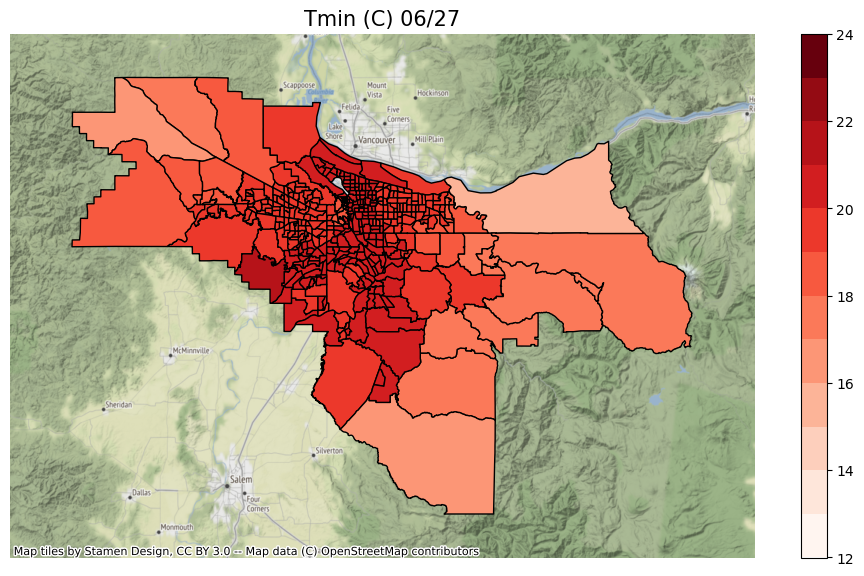

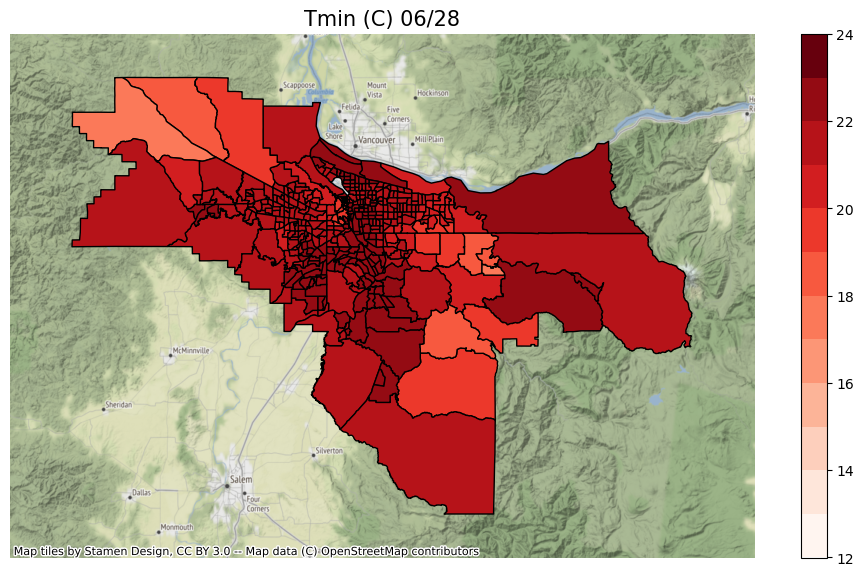

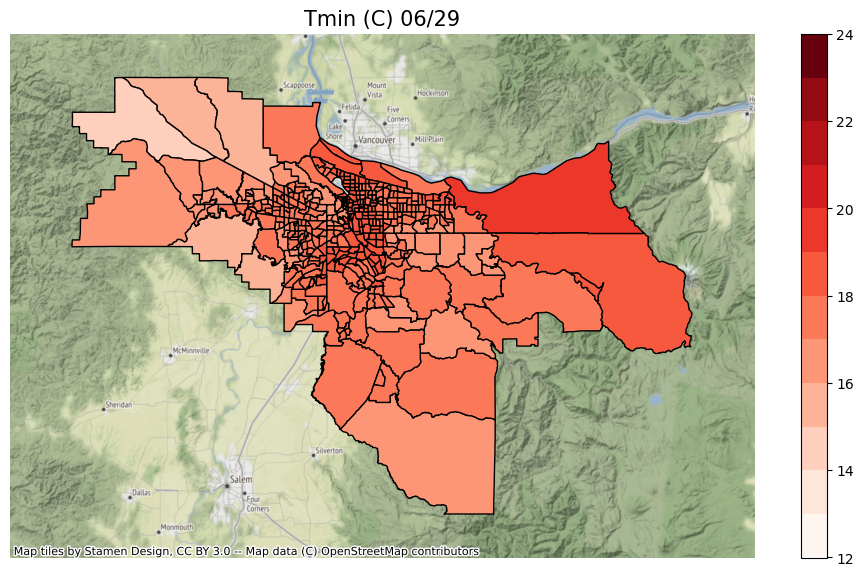

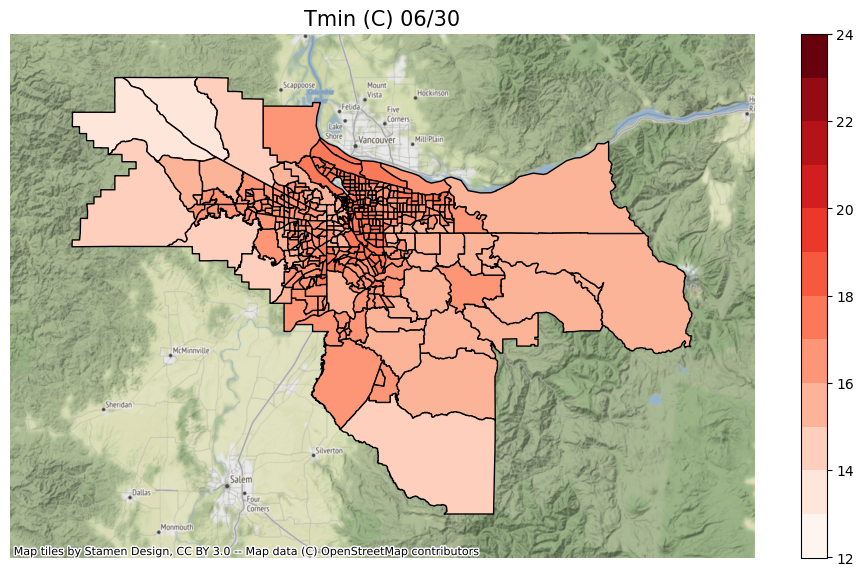

In [39]:
import contextily as cx

if var_s == 'Tmax':
    vmin = 28
    vmax = 40
elif var_s == 'Tmin':
    vmin = 12
    vmax = 24

for day in range(27,31):
    ax = gplt.polyplot(shp_gpd, figsize=(12, 8))
    cx.add_basemap(ax = ax, crs=shp_gpd.crs) 
    ax.set_title(var_s + ' (C) 06/' + str(day), size = 15)
    #shp_gpd.plot(ax=ax, column=var_s.lower() + '_20210630', edgecolor="black",
    shp_gpd.plot(ax=ax, column=var_s.lower() + '_06' + str(day), edgecolor="black",
             vmin=vmin, vmax=vmax,
             cmap = plt.cm.get_cmap('Reds', 12),
             legend=True,legend_kwds={"shrink":.85})  
    plt.show()
#plt.savefig(dir_o + 'tmin_heatwave_2021_new.png', bbox_inches='tight')

#### in future senario
according to Sixth Oregon Climate Assessment of Erica Fleishman table 1 and 2
I want two tables side by side, instead of using
Image(url="t_future_change.png", width=300, height=300)

<table><tr>
<td> <img src="t_future_change.png" alt="Drawing" style="width: 500px;"/> </td>
<td> <img src="prec_future_change.png" alt="Drawing" style="width: 500px;"/> </td>
</tr></table>

 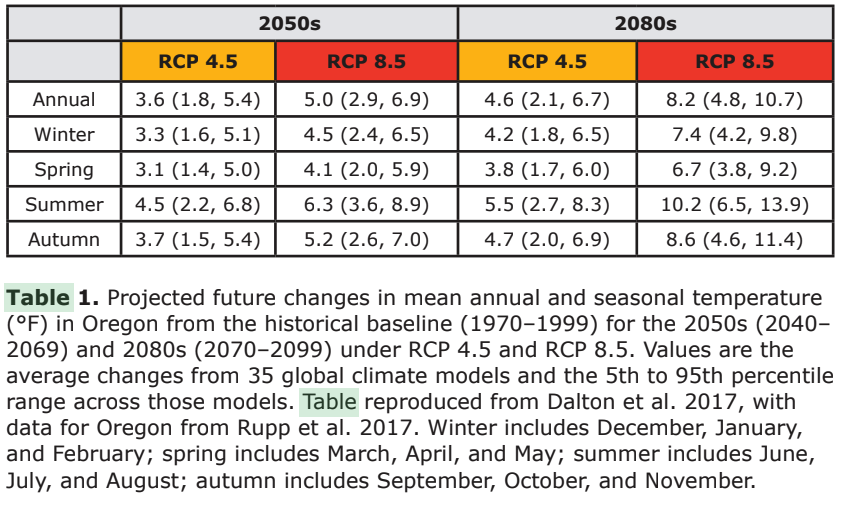
 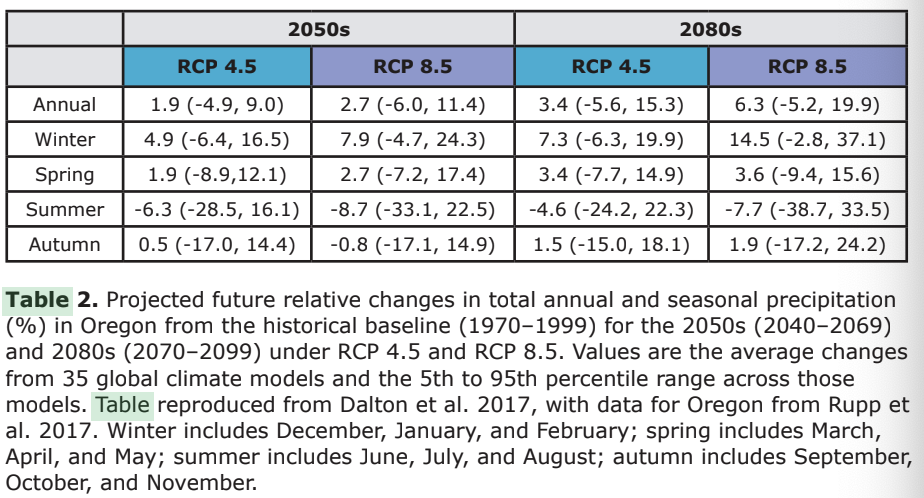

In [8]:
# 2121 summer head wave case adjustment
dt_2050s_RCP45_summer = (2055-2021)/(2055-1985)*4.5*5/9
dt_2050s_RCP85_summer = (2055-2021)/(2055-1985)*6.3*5/9

dt_2080s_RCP45_summer = (2085-2021)/(2085-1985)*5.5*5/9
dt_2080s_RCP85_summer = (2085-2021)/(2085-1985)*10.2*5/9

dt_1d = [dt_2050s_RCP45_summer, dt_2050s_RCP85_summer, dt_2080s_RCP45_summer, dt_2080s_RCP85_summer]
scen_1d =['2050s_RCP45', '2050s_RCP85', '2080s_RCP45', '2080s_RCP85'] 
scen_1d =['50s_45', '50s_85', '80s_45', '80s_85'] 
n_scen = len(scen_1d)

t27_50s_45
t28_50s_45
t29_50s_45
t30_50s_45
t27_50s_85
t28_50s_85
t29_50s_85
t30_50s_85
t27_80s_45
t28_80s_45
t29_80s_45
t30_80s_45
t27_80s_85
t28_80s_85
t29_80s_85
t30_80s_85


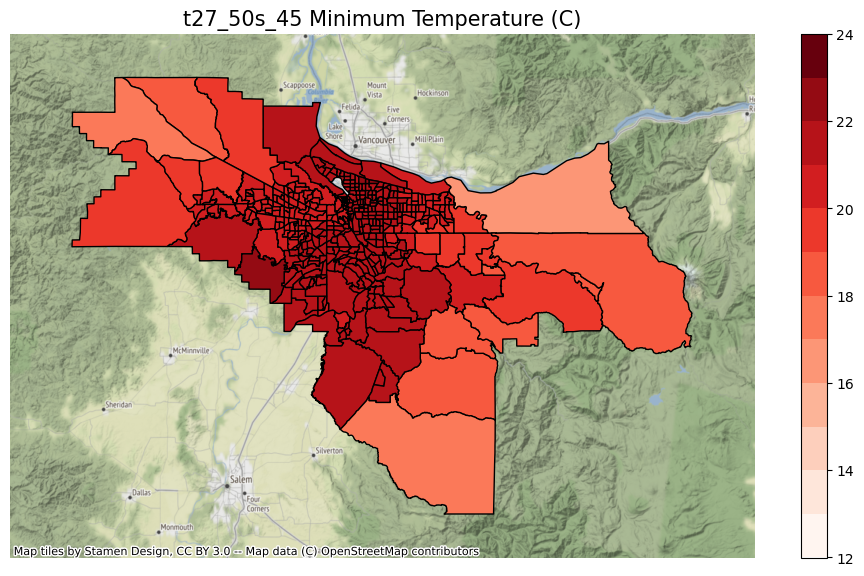

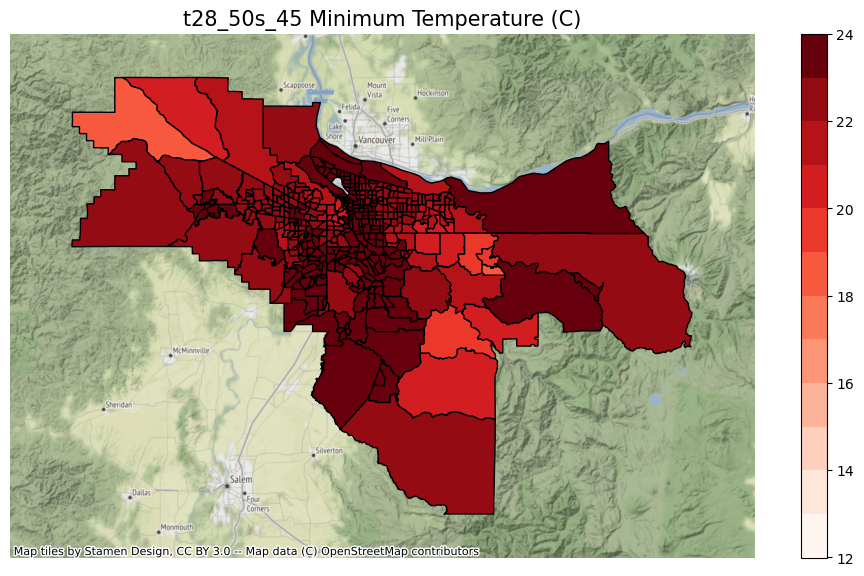

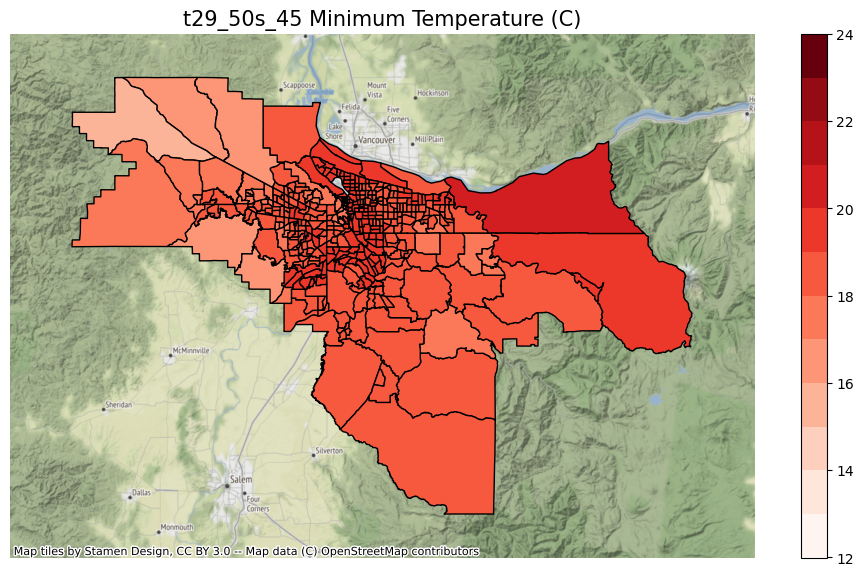

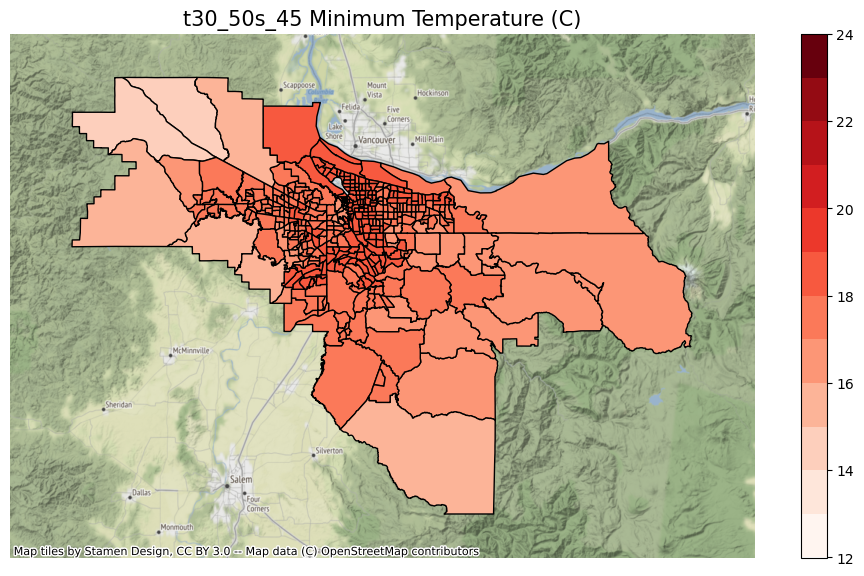

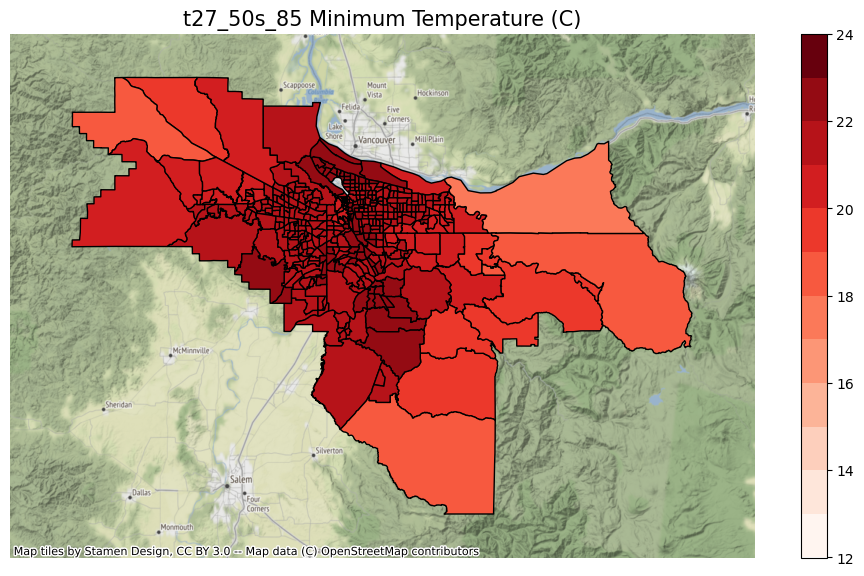

...

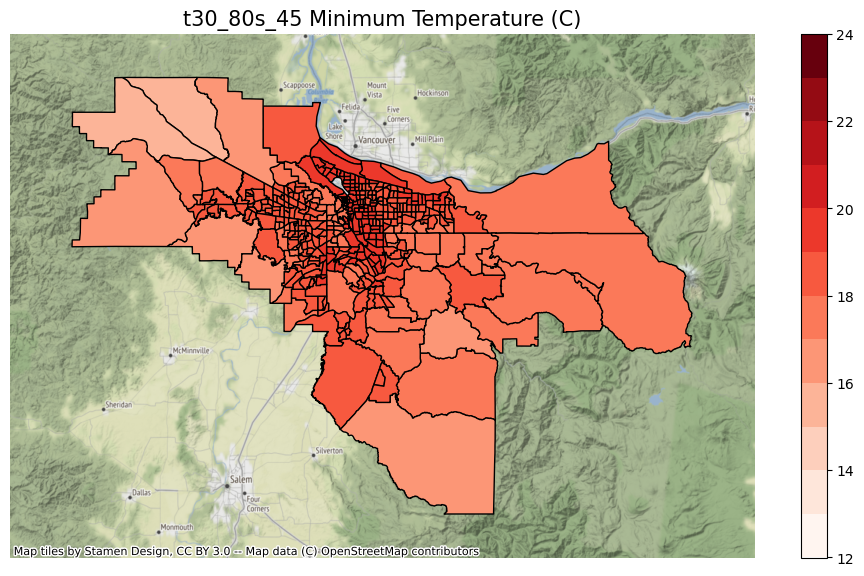

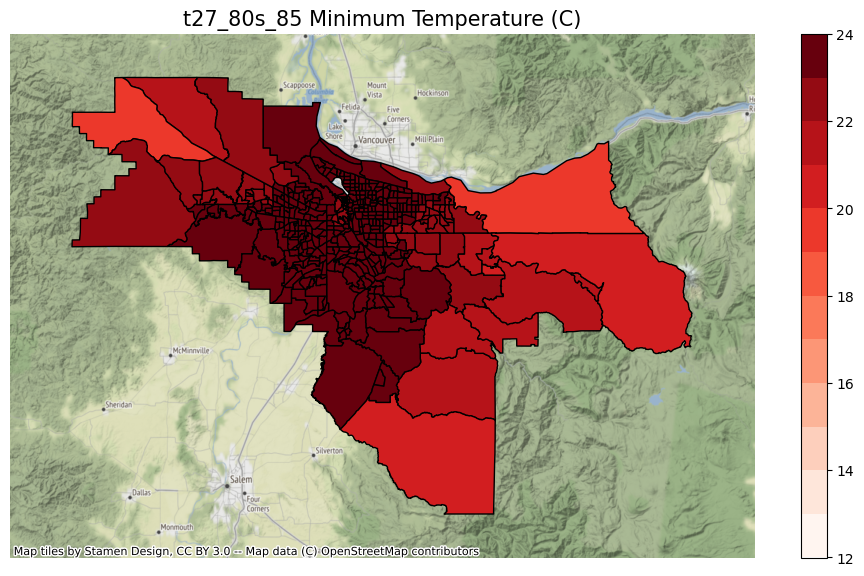

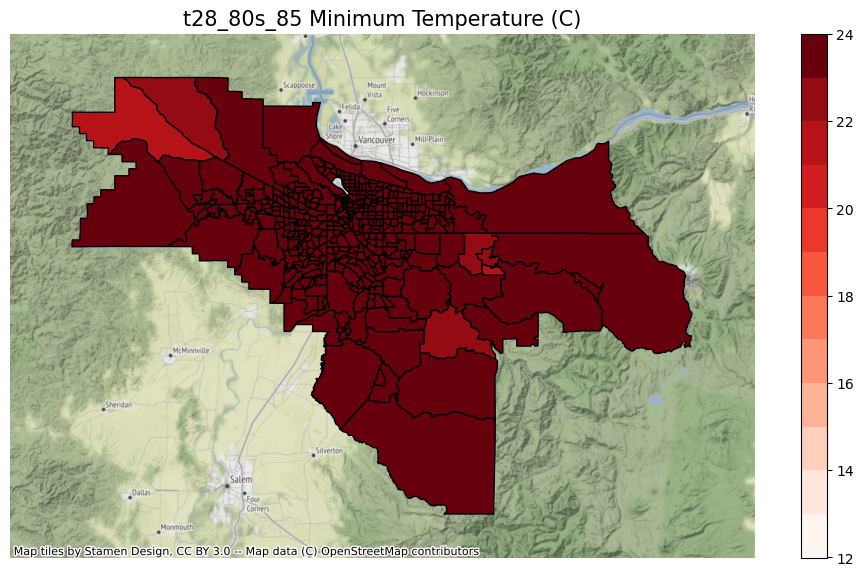

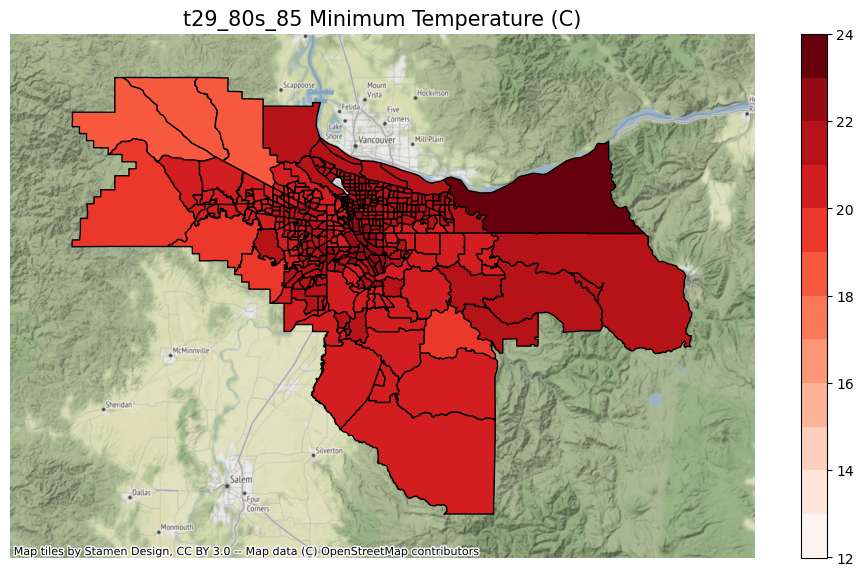

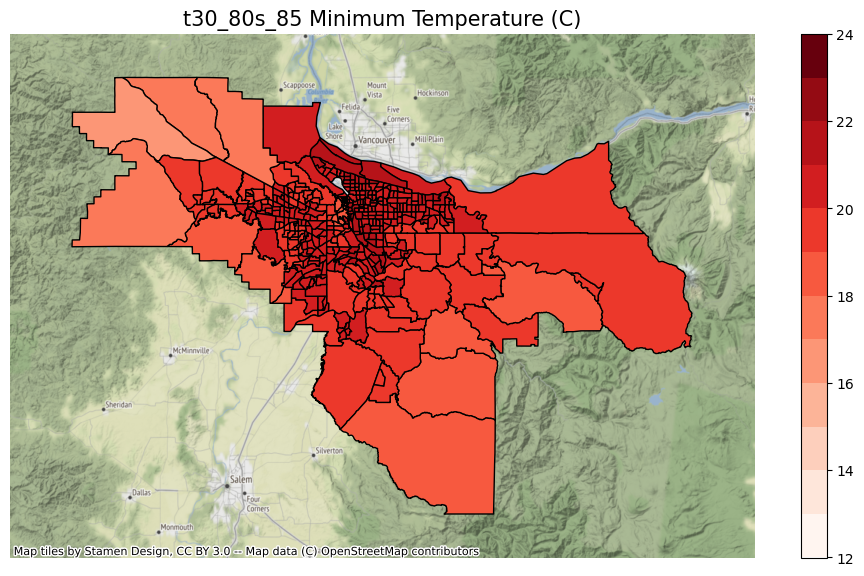

In [38]:
n_day = len(tmax_3d)
tmin_1d = np.zeros((n_shp))

# the column names of shapefiles having a limit of 10 characters 
date_dd = pd.date_range(date_st, date_end, freq='D').format(formatter=lambda x: x.strftime('%d'))

for ns in range(n_scen): 
    for nd in range(n_day):        
        #var_new  = var_s.lower() + '_' + str(date_s[nd]) + '_' + scen_1d[ns]
        var_new  = 't' + str(date_dd[nd]) + '_' + scen_1d[ns]
        print(var_new)
        for nn in range(n_shp):
            lat_0 = shp_gpd['lat_centroid'][nn]
            lon_0 = shp_gpd['lon_centroid'][nn]
            t = tmax_3d[nd].sel(rlon=lon_0, rlat=lat_0, method="nearest")
            tmin_1d[nn]=t.values + dt_1d[ns]
            #print(tmin_1d[nn])
        
        shp_gpd[var_new] = tmin_1d  
    
        ax = gplt.polyplot(shp_gpd, figsize=(12, 8))
        cx.add_basemap(ax = ax, crs=shp_gpd.crs) 
        ax.set_title(var_new + ' Minimum Temperature (C)', size = 15)
        shp_gpd.plot(ax=ax, column=var_new, edgecolor="black",
             vmin=vmin, vmax=vmax,
             cmap = plt.cm.get_cmap('Reds', 12),
             legend=True,legend_kwds={"shrink":.85})

In [10]:
flnm_o = '/glade/campaign/mmm/c3we/mingge/INNOVATOR/DATA/'+ var_s.lower() + "_current_future.shp"
print('output:' + flnm_o)
shp_gpd.to_file(flnm_o) 

output:/glade/campaign/mmm/c3we/mingge/INNOVATOR/DATA/tmin_current_future.shp


/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/geopandas/io/file.py:299: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/glade/scratch/mingge/ipykernel_120921/2650073746.py:3: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  shp_gpd.to_file(flnm_o)


In [18]:
shp_gpd.head
print(shp_gpd.iloc[:, -20:-24] )
#print(shp_gpd.head())
 

Empty GeoDataFrame
Columns: []
Index: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, ...]

[416 rows x 0 columns]


In [37]:
flnm_o = '/glade/campaign/mmm/c3we/mingge/INNOVATOR/DATA/tmin_current_future.shp'
shp_new = gpd.read_file(flnm_o)
print(shp_new.iloc[200:250, -22:-17])
#print(shp_new.head())

     lat_centro  tmin_0627  tmin_0628  tmin_0629  tmin_0630
200   45.378092  21.223299  21.131399  15.677500  14.506100
201   45.517478  19.650900  21.562300  17.518900  16.561199
202   45.410293  20.084400  22.151400  17.710300  16.617899
203   45.539733  19.461399  21.409599  17.230999  16.334099
204   45.536328  18.793299  21.874699  16.850399  16.122599
205   45.450950  19.717400  21.416700  17.182899  16.189100
206   45.548428  19.461399  21.409599  17.230999  16.334099
207   45.503282  19.525799  21.943399  17.945599  16.945200
208   45.437921  19.231100  20.183500  16.808300  15.765400
209   45.414025  20.564999  22.842299  18.630299  17.520000
210   45.426750  20.564999  22.842299  18.630299  17.520000
211   45.343436  20.782200  22.960100  17.362799  16.255199
212   45.371780  19.915600  21.376600  17.089399  16.002800
213   45.419545  19.859600  21.542799  17.501299  16.537699
214   45.360736  20.280699  22.273499  17.988899  16.962700
215   45.418286  19.859600  21.542799  1